In [65]:
%%bash

pip install kaggle segmentation_models_pytorch

#locate kaggle.json to /opt/ml/.kaggle/kaggle.json if you are using linux
mkdir data
cd data

kaggle datasets download -d perke986/face-mask-segmentation-dataset
unzip face-mask-segmentation-dataset.zip

rm face-mask-segmentation-dataset.zip


Archive:  face-mask-segmentation-dataset.zip
  inflating: Info.txt                
  inflating: images/coronavirus-4947340_1920.jpg  
  inflating: images/coronavirus-5064371_1920.jpg  
  inflating: images/mask-4898571_1920.jpg  
  inflating: images/mask-5136259_1920.jpg  
  inflating: images/mouth-guard-5060809_1920.jpg  
  inflating: images/mouth-guard-5068146_1920.jpg  
  inflating: images/nurse-4962034_1920.jpg  
  inflating: images/pexels-andrea-piacquadio-3881247.jpg  
  inflating: images/pexels-anna-shvets-3902881.jpg  
  inflating: images/pexels-anna-shvets-3943881.jpg  
  inflating: images/pexels-anna-shvets-3943882.jpg  
  inflating: images/pexels-anna-shvets-3943883.jpg  
  inflating: images/pexels-anna-shvets-3943884.jpg  
  inflating: images/pexels-anna-shvets-3943910.jpg  
  inflating: images/pexels-anna-shvets-3943952.jpg  
  inflating: images/pexels-anna-shvets-3943953.jpg  
  inflating: images/pexels-anna-shvets-3943954.jpg  
  inflating: images/pexels-anna-shvets-3962

100%|██████████| 78.9M/78.9M [00:03<00:00, 21.4MB/s]


In [66]:
import os
from collections import defaultdict

import cv2
from tqdm import tqdm

from dataset import get_DataLoader
from utils import *


seed = 42
seed_everything(seed)


def get_all_path(root):
    for file_name in os.listdir(root):
        path = os.path.join(root, file_name)
        if os.path.isdir(path):
            get_all_path(path)
        else:
            all_path_dict[path.split('.')[-1]].append(path)
            


In [67]:
all_path_dict = defaultdict(list)
get_all_path('data')

jpg_paths = all_path_dict['jpg']
png_paths = all_path_dict['png']
assert sorted(list(map(lambda x:x.split('.')[0].split('/')[-1], jpg_paths))) == sorted(list(map(lambda x:x.split('.')[0].split('/')[-1], png_paths))), 'pair does not match'

In [68]:
jpg_folder = 'data/images'
png_folder = 'data/masks'

for idx, jpg_file in enumerate(tqdm(os.listdir(jpg_folder))):
    jpg_path = os.path.join(jpg_folder, jpg_file)
    png_path = os.path.join(png_folder, jpg_file[:-3]+'png')
    
    rename_jpg_path = os.path.join(jpg_path.split('/')[0], str(idx) + '.jpg')
    rename_png_path = os.path.join(png_path.split('/')[0], str(idx) + '.png')
    
    os.rename(jpg_path, rename_jpg_path)
    os.rename(png_path, rename_png_path)
    
    mask = cv2.imread(rename_png_path).astype(bool).astype(np.uint8)
    
    mask = cv2.cvtColor(mask,cv2.COLOR_BGR2GRAY)
    cv2.imwrite(rename_png_path, mask)

100%|██████████| 222/222 [00:11<00:00, 18.52it/s]


In [ ]:
!python train.py

In [ ]:
%%bash
rm -rf data

mkdir data
cd data
wget https://prod-aistages-public.s3.amazonaws.com/app/Competitions/000001/data/train.tar.gz
tar -zvxf train.tar.gz
find . -name '._*' -exec rm {} \;
pip install segmentation_models_pytorchopencv-python albumentations

rm train.tar.gz

In [1]:
import torch
import segmentation_models_pytorch as smp
from models import *

def load_model(model, path,pretrained='imagenet'):
    model = DeepLabV3Plus(model, pretrained, 3, 2)
    model.load_state_dict(torch.load(path))
    model.eval()
    
    return model

In [2]:
import os
from tqdm import tqdm

base = 'data/train/images'

img_paths = []
for folder_name in tqdm(os.listdir(base)):
    
    _path = os.path.join(base, folder_name)
    
    for file_name in os.listdir(_path):
        path = os.path.join(_path, file_name)
        
        if '.jpg' in path:
            img_paths.append(path)
        
        

100%|██████████| 2700/2700 [00:00<00:00, 31937.23it/s]


In [3]:
import cv2
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader

from torchvision.utils import save_image


def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255
    return image

def get_train_transform(height = 512, width = 512):
    return A.Compose([
                    A.Resize(height, width),
                    ToTensorV2()
                    ])


class PseudoDataLoader(Dataset):
    """COCO format"""
    def __init__(self, dataset_path: list, transform = None):
        super().__init__()
        self.dataset_path = dataset_path
        self.transform = transform
        
        
    def __getitem__(self, index: int):
        # dataset이 index되어 list처럼 동작
        
        path = self.dataset_path[index]
        
        images = load_image(path)
        
        path, _ = path.split('.')
        path = path + '.png'
        
        # transform -> albumentations 라이브러리 활용
        if self.transform is not None:
            transformed = self.transform(image=images)
            images = transformed["image"]

        return images, path
    
    def __len__(self) -> int:
        # 전체 dataset의 size를 return
        return len(self.dataset_path)



dataset = PseudoDataLoader(img_paths, get_train_transform())
loader = DataLoader(dataset=dataset, batch_size=64, shuffle=False,
                        num_workers=1,
                        pin_memory=True, drop_last=False)


In [4]:
def save_images(outs, paths):
    for output, path in zip(outs, paths):

        output = output.detach().cpu().apply_(lambda x: 1 if x >= 0.5 else 0)
    
        output = output[1,:,:].numpy().astype(np.uint8)

        cv2.imwrite(path, output)

        
def gen_images():
    device = "cuda" if torch.cuda.is_available() else "cpu" 
    model = load_model('senet154', 'pseudo_labeling_model/epoch_19.pth', pretrained='imagenet')
    model.to(device)
    with torch.no_grad():
        for images, paths in tqdm(loader):
            images = images.float().to(device)
            outs = model(images)
            save_images(outs, paths)
            
gen_images()

100%|██████████| 282/282 [46:59<00:00, 10.00s/it]


In [5]:
def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    return image

def save_image(path, image):
    cv2.imwrite(path, output)


def resize_transform(height = 512, width = 512):
    return A.Compose([
                    A.Resize(height, width),
                    ])

res_transform = resize_transform()

for path in tqdm(img_paths):
    transformed = res_transform(image=load_image(path))
    
    cv2.imwrite(path, transformed['image'])
    

100%|██████████| 18035/18035 [02:35<00:00, 116.06it/s]


In [6]:
import cv2
import numpy as np

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255
    return image


img = load_image('data/train/images/006959_male_Asian_19/normal.jpg')
img.shape

(512, 512, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

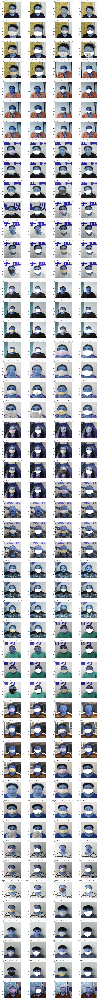

In [7]:
import matplotlib.pyplot as plt

def show_images(img_paths:list, n:int, base_dir='data'):
    fig = plt.figure(figsize=(24, 500))

    assert (len(img_paths) > n), 'number of paths should larger than n'
    
    img_paths = cv2.cvtColor(img_paths[:n], cv2.COLOR_RGB2BGR)
    
    transform = get_train_transform()
    
    idx = 1
    
    for path in img_paths:
        image = load_image(path)
        
        transformed = transform(image=image)
        image = transformed["image"]        
        
        title = '_'.join(path.split('/')[-2:])
        
        image = image.permute(1,2,0)
        
        
        ax = fig.add_subplot(n,4,idx)
        ax.imshow(image)
        ax.set_title(f'{title} : image')
        
        idx += 1
        
        mask_path = path.split('.')[0] + '.png'
        mask = load_image(mask_path)
        
        ax = fig.add_subplot(n,4,idx)
        ax.imshow(image+mask*255)
        
        idx += 1
        ax.set_title(f'{title} : mask')

    plt.show()
    

show_images(img_paths, 100)